> This notebook follows the [fastai style guide](https://docs.fast.ai/dev/style.html).

![](../images/13_implementing_stable_diffusion_from_its_components/thumbnail.png){fig-alt='A hooded programmer diffusing a stick of red dynamite by pinching the flame on the fuse; oil pastel drawing'}

In this notebook, we'll implement stable diffusion from its various components through the [Hugging Face Diffusers](https://huggingface.co/docs/diffusers/index) library.

At the end, we'll have our own custom stable diffusion class, from which we can generate images as simply as `diffuser.diffuse()`.

If you would like a refresher, I've summarized at a high level how a diffuser is trained in [this](12_stable_diffusion_summarized.qmd) post. Though this notebook focuses on inference and not the training aspect, the linked summary may be helpful.

Let's begin.

## Overview

Before we get hands on with the code, let's refresh how inference works for a diffuser.

1. We input a prompt to the diffuser.
1. This prompt is given a mathematical representation (an embedding) through the text encoder.
1. A latent comprised of noise is produced.
1. The U-Net predicts the noise in the latent in conjunction with the prompt.
1. The predicted noise is subtracted from the latent in conjunction with the scheduler.
1. After many iterations, the denoised latent is decompressed to produce our final generated image.

The main components in use are:

* a text encoder,
* a U-Net,
* and a VAE decoder.

## Setup

In [1]:
! pip install -Uqq fastcore transformers diffusers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 40.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 934.9/934.9 kB 57.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 23.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 29.1 MB/s eta 0:00:00


In [2]:
#| code-annotations: hover
import logging; logging.disable(logging.WARNING) # <1>
from fastcore.all import *
from fastai.imports import *
from fastai.vision.all import *

1. Hugging Face can be very verbose.

## Get Components

### CLIP Components

To process the prompt, we need to download a tokenizer and a text encoder. The tokenizer will split the prompt into tokens while the text encoder will convert the tokens into a numerical representation (an embedding).

In [3]:
from transformers import CLIPTokenizer, CLIPTextModel

tokz = CLIPTokenizer.from_pretrained('openai/clip-vit-large-patch14', torch_dtype=torch.float16)
txt_enc = CLIPTextModel.from_pretrained('openai/clip-vit-large-patch14', torch_dtype=torch.float16).to('cuda')

`float16` is used for faster performance.

### U-Net and VAE

The U-Net will predict the noise in the image, while the VAE will decompress the generated image.

In [4]:
from diffusers import AutoencoderKL, UNet2DConditionModel

vae = AutoencoderKL.from_pretrained('stabilityai/sd-vae-ft-ema', torch_dtype=torch.float16).to('cuda')
unet = UNet2DConditionModel.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="unet", torch_dtype=torch.float16).to("cuda")

### Scheduler

The scheduler will control how much noise is intially added to the image, and will also control how much of the noise predicted from the U-Net will be subtracted from the image.

In [5]:
from diffusers import LMSDiscreteScheduler

sched = LMSDiscreteScheduler(
    beta_start = 0.00085,
    beta_end = 0.012,
    beta_schedule = 'scaled_linear',
    num_train_timesteps = 1000
); sched

LMSDiscreteScheduler {
  "_class_name": "LMSDiscreteScheduler",
  "_diffusers_version": "0.16.1",
  "beta_end": 0.012,
  "beta_schedule": "scaled_linear",
  "beta_start": 0.00085,
  "num_train_timesteps": 1000,
  "prediction_type": "epsilon",
  "trained_betas": null
}

## Define Generation Parameters

The six main parameters needed for generation are:

* The prompt
* The width and height of the image
* A number describing how noisy the output image is to be (the number of inference steps)
* A number describing how much the diffuser should stick to the prompt (the guidance scale)
* The batch size
* The seed

In [6]:
prompt = ['a photograph of an astronaut riding a horse']
w, h = 512, 512
n_inf_steps = 70
g_scale = 7.5
bs = 1
seed = 77

## Encode Prompt

Now we need to parse the prompt. To do so, we'll first tokenize it, and then encode the tokens to produce an embedding.

First, let's tokenize.

In [7]:
txt_inp = tokz(
    prompt,
    padding = 'max_length',
    max_length = tokz.model_max_length,
    truncation = True,
    return_tensors = 'pt'
); txt_inp

{'input_ids': tensor([[49406,   320,  8853,   539,   550, 18376,  6765,   320,  4558, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0]])}

The token `49407` is a padding token and represents `'<|endoftext|>'`. These tokens have been given an attention mask of 0.

In [8]:
tokz.decode(49407)

'<|endoftext|>'

Now using the text encoder, we'll create an embedding out of these tokens.

In [9]:
txt_emb = txt_enc(txt_inp['input_ids'].to('cuda'))[0].half(); txt_emb

tensor([[[-0.3884,  0.0229, -0.0523,  ..., -0.4902, -0.3066,  0.0674],
         [ 0.0292, -1.3242,  0.3076,  ..., -0.5254,  0.9766,  0.6655],
         [ 0.4609,  0.5610,  1.6689,  ..., -1.9502, -1.2266,  0.0093],
         ...,
         [-3.0410, -0.0674, -0.1777,  ...,  0.3950, -0.0174,  0.7671],
         [-3.0566, -0.1058, -0.1936,  ...,  0.4258, -0.0184,  0.7588],
         [-2.9844, -0.0850, -0.1726,  ...,  0.4373,  0.0092,  0.7490]]],
       device='cuda:0', dtype=torch.float16, grad_fn=<NativeLayerNormBackward0>)

In [10]:
txt_emb.shape

torch.Size([1, 77, 768])

## Embeddings for CFG

We also need to create an embedding for an empty prompt, also known as the uncondtional prompt. This embedding is what is used to control the guidance.

In [11]:
txt_inp['input_ids'].shape

torch.Size([1, 77])

In [12]:
max_len = txt_inp['input_ids'].shape[-1] # <1>
uncond_inp = tokz(
    [''] * bs, # <2>
    padding = 'max_length',
    max_length = max_len,
    return_tensors = 'pt',
); uncond_inp

{'input_ids': tensor([[49406, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407]]), 'attention_mask': tensor([[1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0]])}

1. We use the maximum length of the prompt so the unconditional prompt embedding matches the size of the text prmpt embedding.
1. We also multiply the list containing the empty prompt with the batch size so we have an empty prompt for each text prompt.

In [13]:
uncond_inp['input_ids'].shape

torch.Size([1, 77])

In [14]:
uncond_emb = txt_enc(uncond_inp['input_ids'].to('cuda'))[0].half()
uncond_emb.shape

torch.Size([1, 77, 768])

We can then concatenate both the unconditonal embedding and the text embedding together. This allows images to be generated from each prompt without having to go through the U-Net twice.

In [15]:
embs = torch.cat([uncond_emb, txt_emb])

## Create Noisy Image

It's now time to create our noisy image, which will be the starting point for generation.

We'll create a single latent that is 64 by 64 pixels, and that also has 4 channels. After the latent is denoised, we'll decompress it to a 512 by 512 pixel image with 3 channels.

In [16]:
bs, unet.config.in_channels, h//8, w//8

(1, 4, 64, 64)

In [17]:
print(torch.randn((2, 3, 4)))
print(torch.randn((2, 3, 4)).shape)

tensor([[[ 0.0800, -1.3597, -0.2033, -0.5647],
         [-1.6066,  0.8178,  1.0832,  0.0638],
         [ 0.3133,  1.8516,  0.4320, -0.9295]],

        [[-1.0798,  3.2928,  0.7443,  1.2190],
         [-0.4984,  0.3551, -0.6012, -0.5856],
         [-0.3988, -1.2950, -1.6061, -0.0207]]])
torch.Size([2, 3, 4])


In [18]:
torch.manual_seed(seed)
lats = torch.randn((bs, unet.config.in_channels, h//8, w//8)); lats.shape

torch.Size([1, 4, 64, 64])

The latent is a rank 4 tensor. `1` refers to the batch size, which is the number of images being generated. `4` is the number of channels, and `64` is the number of pixel with regard to both height and width.

In [19]:
lats = lats.to('cuda').half(); lats

tensor([[[[-0.5044, -0.4163, -0.1365,  ..., -1.6104,  0.1381,  1.7676],
          [ 0.7017,  1.5947, -1.4434,  ..., -1.5859, -0.4089, -2.8164],
          [ 1.0664, -0.0923,  0.3462,  ..., -0.2390, -1.0947,  0.7554],
          ...,
          [-1.0283,  0.2433,  0.3337,  ...,  0.6641,  0.4219,  0.7065],
          [ 0.4280, -1.5439,  0.1409,  ...,  0.8989, -1.0049,  0.0482],
          [-1.8682,  0.4988,  0.4668,  ..., -0.5874, -0.4019, -0.2856]],

         [[ 0.5688, -1.2715, -1.4980,  ...,  0.2230,  1.4785, -0.6821],
          [ 1.8418, -0.5117,  1.1934,  ..., -0.7222, -0.7417,  1.0479],
          [-0.6558,  0.1201,  1.4971,  ...,  0.1454,  0.4714,  0.2441],
          ...,
          [ 0.9492,  0.1953, -2.4141,  ..., -0.5176,  1.1191,  0.5879],
          [ 0.2129,  1.8643, -1.8506,  ...,  0.8096, -1.5264,  0.3191],
          [-0.3640, -0.9189,  0.8931,  ..., -0.4944,  0.3916, -0.1406]],

         [[-0.5259,  1.5059, -0.3413,  ...,  1.2539,  0.3669, -0.1593],
          [-0.2957, -0.1169, -

Our latent has random values which represent noise. This noise needs to be scaled so it can work with the scheduler.

In [20]:
sched.set_timesteps(n_inf_steps); sched

LMSDiscreteScheduler {
  "_class_name": "LMSDiscreteScheduler",
  "_diffusers_version": "0.16.1",
  "beta_end": 0.012,
  "beta_schedule": "scaled_linear",
  "beta_start": 0.00085,
  "num_train_timesteps": 1000,
  "prediction_type": "epsilon",
  "trained_betas": null
}

In [21]:
lats *= sched.init_noise_sigma; sched.init_noise_sigma

tensor(14.6146)

In [22]:
sched.sigmas

tensor([14.6146, 13.3974, 12.3033, 11.3184, 10.4301,  9.6279,  8.9020,  8.2443,
         7.6472,  7.1044,  6.6102,  6.1594,  5.7477,  5.3709,  5.0258,  4.7090,
         4.4178,  4.1497,  3.9026,  3.6744,  3.4634,  3.2680,  3.0867,  2.9183,
         2.7616,  2.6157,  2.4794,  2.3521,  2.2330,  2.1213,  2.0165,  1.9180,
         1.8252,  1.7378,  1.6552,  1.5771,  1.5031,  1.4330,  1.3664,  1.3030,
         1.2427,  1.1852,  1.1302,  1.0776,  1.0272,  0.9788,  0.9324,  0.8876,
         0.8445,  0.8029,  0.7626,  0.7236,  0.6858,  0.6490,  0.6131,  0.5781,
         0.5438,  0.5102,  0.4770,  0.4443,  0.4118,  0.3795,  0.3470,  0.3141,
         0.2805,  0.2455,  0.2084,  0.1672,  0.1174,  0.0292,  0.0000])

In [23]:
sched.timesteps

tensor([999.0000, 984.5217, 970.0435, 955.5652, 941.0870, 926.6087, 912.1304,
        897.6522, 883.1739, 868.6957, 854.2174, 839.7391, 825.2609, 810.7826,
        796.3043, 781.8261, 767.3478, 752.8696, 738.3913, 723.9130, 709.4348,
        694.9565, 680.4783, 666.0000, 651.5217, 637.0435, 622.5652, 608.0870,
        593.6087, 579.1304, 564.6522, 550.1739, 535.6957, 521.2174, 506.7391,
        492.2609, 477.7826, 463.3043, 448.8261, 434.3478, 419.8696, 405.3913,
        390.9130, 376.4348, 361.9565, 347.4783, 333.0000, 318.5217, 304.0435,
        289.5652, 275.0870, 260.6087, 246.1304, 231.6522, 217.1739, 202.6957,
        188.2174, 173.7391, 159.2609, 144.7826, 130.3043, 115.8261, 101.3478,
         86.8696,  72.3913,  57.9130,  43.4348,  28.9565,  14.4783,   0.0000],
       dtype=torch.float64)

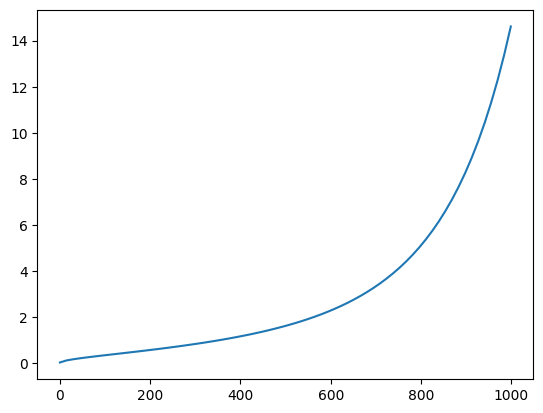

In [24]:
plt.plot(sched.timesteps, sched.sigmas[:-1])

## Denoise

The denoising process can now begin!

In [25]:
from tqdm.auto import tqdm

for i, ts in enumerate(tqdm(sched.timesteps)):
  inp = torch.cat([lats] * 2) # <1>
  inp = sched.scale_model_input(inp, ts) # <2>

  with torch.no_grad(): preds = unet(inp, ts, encoder_hidden_states=embs).sample # <3>

  pred_uncond, pred_txt = preds.chunk(2) # <4>
  pred = pred_uncond + g_scale * (pred_txt - pred_uncond) # <4>

  lats = sched.step(pred, ts, lats).prev_sample #<5>

  0%|          | 0/70 [00:00<?, ?it/s]

1. We first create two latents: one for the text prompt, and one for the unconditional prompt.

2. We then further scale the noise on the latents.

3. We then predict noise.

4. We then perform guidance.

5. We then subtract the predicted, guided noise from the image.

## Decompress

We can now decompress the latent and display it.

In [26]:
with torch.no_grad(): img = vae.decode(1/0.18215*lats).sample

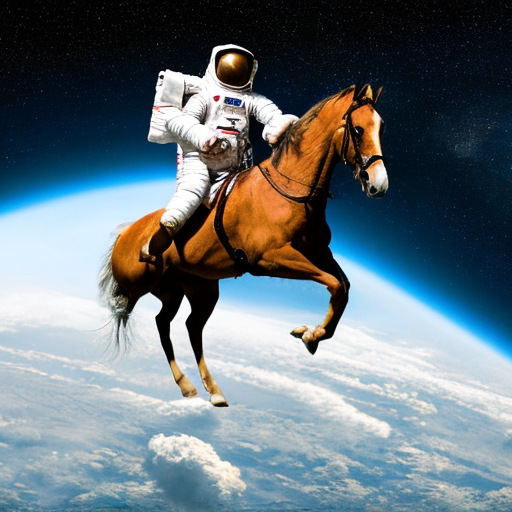

In [27]:
img = (img / 2 + 0.5).clamp(0, 1)
img = img[0].detach().cpu().permute(1, 2, 0).numpy()
img = (img * 255).round().astype('uint8')
Image.fromarray(img)

And there you have it! We implemented stable diffusion using a text encoder, VAE, and U-Net!

Let's encapsulate everything so it looks simpler.

## Encapsulation

First we'll encapsulate everything into functions, then we'll encapsulate into a class.

### Functions

The main steps that are happening are:

- We create embeddings.
- We create latents.
- We denoise the latents.
- We decompress the latents.

#### Create Embeddings

In [28]:
def set_embs():
  txt_inp = tok_seq(prompt)
  uncond_inp = tok_seq(['']*len(prompt), max_len=txt_inp['input_ids'].shape[-1])

  txt_emb = make_emb(txt_inp['input_ids'])
  uncond_emb = make_emb(uncond_inp['input_ids'])
  return torch.cat([uncond_emb, txt_emb])

def tok_seq(prompt, max_len=None):
  if max_len is None: max_len = tokz.model_max_length
  return tokz(
      prompt,
      padding = 'max_length',
      max_length = max_len,
      truncation = True,
      return_tensors = 'pt'
  )

def make_emb(input_ids):
  return txt_enc(input_ids.to('cuda'))[0].half()

#### Create Latents

In [29]:
def set_lat():
  torch.manual_seed(seed)
  lat = torch.randn((bs, unet.config.in_channels, h//8, w//8))
  sched.set_timesteps(n_inf_steps)
  return lat.to('cuda').half() * sched.init_noise_sigma

#### Denoise Latents

In [30]:
def denoise(latent, embeddings, timestep):
  inp = sched.scale_model_input(torch.cat([latent]*2), timestep)
  with torch.no_grad():
    pred_uncond, pred_txt = unet(inp, timestep, encoder_hidden_states=embeddings).sample.chunk(2)
  pred = pred_uncond + g_scale * (pred_txt - pred_uncond)
  return sched.step(pred, timestep, latent).prev_sample

#### Decompress Latents

In [31]:
def decompress_lat(latent):
  with torch.no_grad(): img = vae.decode(1/0.18215*latent).sample
  img = (img / 2 + 0.5).clamp(0, 1)
  img = img[0].detach().cpu().permute(1, 2, 0).numpy()
  return (img * 255).round().astype('uint8')

#### Putting it All Together

  0%|          | 0/70 [00:00<?, ?it/s]

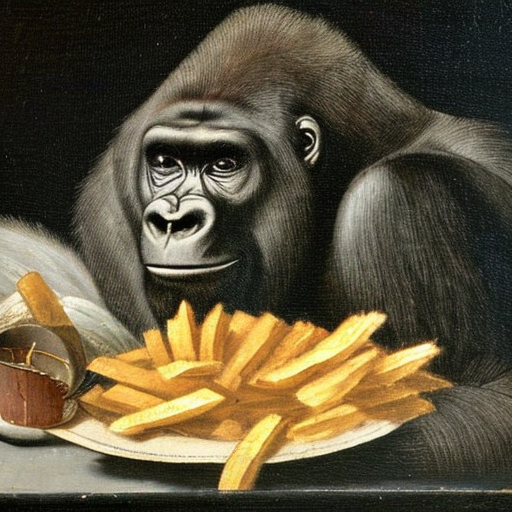

In [32]:
prompt = ['An antique 18th century painting of a gorilla eating a plate of chips.']
embs = set_embs()
lat = set_lat()
for i, ts in enumerate(tqdm(sched.timesteps)): lat = denoise(lat, embs, ts)
img = decompress_lat(lat)
Image.fromarray(img)

#### Negative Prompts.

To implement negative prompts, we can simply pass in a list containing the negative prompt. This will be used in place of the empty list used for the unconditional prompt.

In [33]:
def set_embs():
  txt_inp = tok_seq(prompt)
  uncond_inp = tok_seq(neg_prompt*len(prompt), max_len=txt_inp['input_ids'].shape[-1])

  txt_emb = make_emb(txt_inp['input_ids'])
  uncond_emb = make_emb(uncond_inp['input_ids'])
  return torch.cat([uncond_emb, txt_emb])

def tok_seq(prompt, max_len=None):
  if max_len is None: max_len = tokz.model_max_length
  return tokz(
      prompt,
      padding = 'max_length',
      max_length = max_len,
      truncation = True,
      return_tensors = 'pt'
  )

  0%|          | 0/70 [00:00<?, ?it/s]

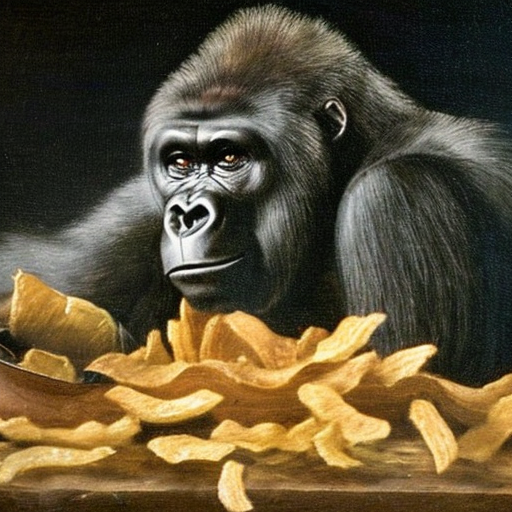

In [34]:
prompt = ['An antique 18th century painting of a gorilla eating a plate of chips.']
neg_prompt = ['plate']
embs = set_embs()
lat = set_lat()
for i, ts in enumerate(tqdm(sched.timesteps)): lat = denoise(lat, embs, ts)
img = decompress_lat(lat)
Image.fromarray(img)

Let's now encapsulate everything into a class, so we can much more easily further iterate.

### Class

I'll be tweaking the code above so that multiple prompts can be input.

This is as simple as using the length of the list of prompts as the batch size (an image is generated for each prompt).

In [35]:
class Diffuser:
  def __init__(self, prompts, neg_prompt=[''], guidance=7.5, seed=100, steps=70, width=512, height=512):
    self.prompts = prompts
    self.bs = len(prompts)
    self.neg_prompt = neg_prompt
    self.g = guidance
    self.seed = seed
    self.steps = steps
    self.w = width
    self.h = height
  
  def diffuse(self, progress=0):
    embs = self.set_embs()
    lats = self.set_lats()
    for i, ts in enumerate(tqdm(sched.timesteps)): lats = self.denoise(lats, embs, ts)
    return self.decompress_lats(lats)
  
  def set_embs(self):
    txt_inp = self.tok_seq(self.prompts)
    neg_inp = self.tok_seq(self.neg_prompt * len(self.prompts))

    txt_embs = self.make_embs(txt_inp['input_ids'])
    neg_embs = self.make_embs(neg_inp['input_ids'])
    return torch.cat([neg_embs, txt_embs])
  
  def tok_seq(self, prompts, max_len=None):
    if max_len is None: max_len = tokz.model_max_length
    return tokz(prompts, padding='max_length', max_length=max_len, truncation=True, return_tensors='pt')    
  
  def make_embs(self, input_ids):
    return txt_enc(input_ids.to('cuda'))[0].half()

  def set_lats(self):
    torch.manual_seed(self.seed)
    lats = torch.randn((self.bs, unet.config.in_channels, self.h//8, self.w//8))
    sched.set_timesteps(self.steps)
    return lats.to('cuda').half() * sched.init_noise_sigma

  def denoise(self, latents, embeddings, timestep):
    inp = sched.scale_model_input(torch.cat([latents]*2), timestep)
    with torch.no_grad(): pred_neg, pred_txt = unet(inp, timestep, encoder_hidden_states=embeddings).sample.chunk(2)
    pred = pred_neg + self.g * (pred_txt - pred_neg)
    return sched.step(pred, timestep, latents).prev_sample

  def decompress_lats(self, latents):
    with torch.no_grad(): imgs = vae.decode(1/0.18215*latents).sample
    imgs = (imgs / 2 + 0.5).clamp(0, 1)
    imgs = [img.detach().cpu().permute(1, 2, 0).numpy() for img in imgs]
    return [(img*255).round().astype('uint8') for img in imgs]

  def update_params(self, **kwargs):
    allowed_params = ['prompts', 'neg_prompt', 'guidance', 'seed', 'steps', 'width', 'height']
    for k, v in kwargs.items():
      if k not in allowed_params:
        raise ValueError(f"Invalid parameter name: {k}")
      if k == 'prompts':
        self.prompts = v
        self.bs = len(v)
      else:
        setattr(self, k, v)

Now creating a diffuser is as simple as this!

In [36]:
prompts = [
    'A lightning bolt striking a jumbo jet; 4k; photorealistic',
    'A toaster in the style of Jony Ive; modern; different; apple; form over function'
]
diffuser = Diffuser(prompts, seed=42)
imgs = diffuser.diffuse()

  0%|          | 0/70 [00:00<?, ?it/s]

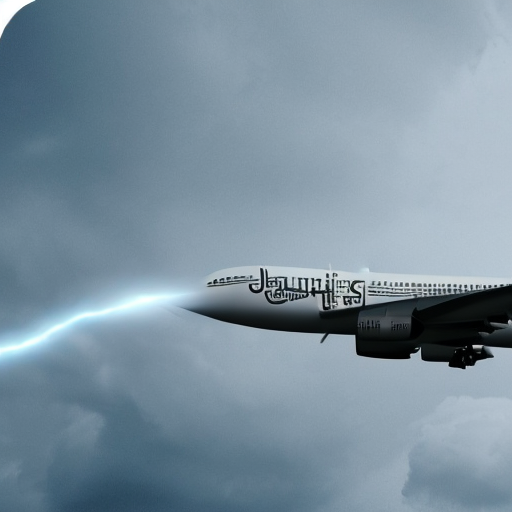

In [37]:
Image.fromarray(imgs[0])

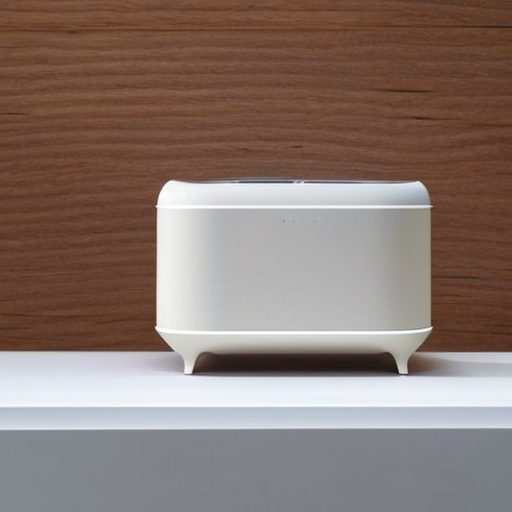

In [38]:
Image.fromarray(imgs[1])

Let's remove the wooden background from the second image.

  0%|          | 0/70 [00:00<?, ?it/s]

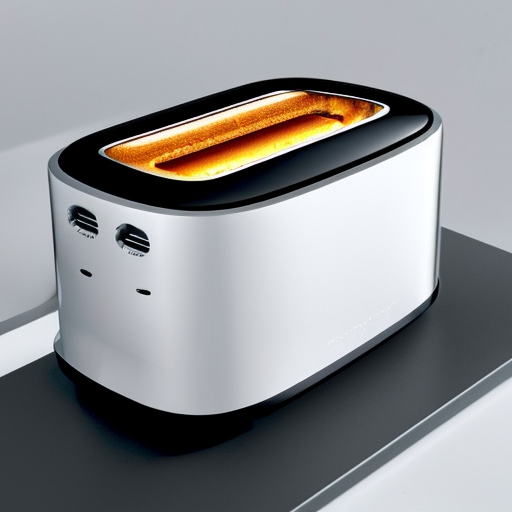

In [39]:
prompt = [prompts[1]]
diffuser.update_params(prompts=prompt, neg_prompt='wood')
Image.fromarray(diffuser.diffuse()[0])

Now that we have a class, we can easily add more functionality to our diffuser.

## Extra Functionality

### Callbacks

Let's make the diffuser output how the generated image looks like at each step interval (e.g., every 5 steps), if specified so.

To do so, we can simply tweak the `diffuser.diffuse()` method by make it output the latent at each desired interval.

```python
def diffuse(self, interval=0)
  embs = self.set_embs()
  lats = self.set_lats()
  if interval > 0: # <1>
    row = [] # <2>
    for i, ts in enumerate(tqdm(sched.timesteps)):
      lats = self.denoise(lats, embs, ts)
      if (i % progress) == 0: # <3>
        row.append(self.decompress_lats(lats)[0])
    row = np.concatenate(row, axis=1) # <4>
    display(Image.fromarray(row)) # <5>
  else:
    for i, ts in enumerate(tqdm(sched.timesteps)): lats = self.denoise(lats, embs, ts)
  return self.decompress_lats(lats)
```

1. We first check if callbacks are desired (we can't save how the latents looked like every 0 intervals). 
2. An empty list is created to store the images.
3. We check if we have reached our desired interval. If the current loop number matches the interval, it should divide the interval cleanly.
4. We smoosh all images into one long line.
5. The image is displayed.

In [40]:
#| code-fold: true
#| code-summary: Diffuser Class Redefined
class Diffuser:
  def __init__(self, prompts, neg_prompt=[''], guidance=7.5, seed=100, steps=70, width=512, height=512):
    self.prompts = prompts
    self.bs = len(prompts)
    self.neg_prompt = neg_prompt
    self.g = guidance
    self.seed = seed
    self.steps = steps
    self.w = width
    self.h = height
  
  def diffuse(self, interval=0):
    embs = self.set_embs()
    lats = self.set_lats()
    if interval > 0:
      row = []
      for i, ts in enumerate(tqdm(sched.timesteps)):
        lats = self.denoise(lats, embs, ts)
        if (i % interval) == 0: row.append(self.decompress_lats(lats)[0])
      row = np.concatenate(row, axis=1)
      display(Image.fromarray(row))
    else: 
      for i, ts in enumerate(tqdm(sched.timesteps)): lats = self.denoise(lats, embs, ts)
    return self.decompress_lats(lats)
  
  def set_embs(self):
    txt_inp = self.tok_seq(self.prompts)
    neg_inp = self.tok_seq(self.neg_prompt * len(self.prompts))

    txt_embs = self.make_embs(txt_inp['input_ids'])
    neg_embs = self.make_embs(neg_inp['input_ids'])
    return torch.cat([neg_embs, txt_embs])
  
  def tok_seq(self, prompts, max_len=None):
    if max_len is None: max_len = tokz.model_max_length
    return tokz(prompts, padding='max_length', max_length=max_len, truncation=True, return_tensors='pt')    
  
  def make_embs(self, input_ids):
    return txt_enc(input_ids.to('cuda'))[0].half()

  def set_lats(self):
    torch.manual_seed(self.seed)
    lats = torch.randn((self.bs, unet.config.in_channels, self.h//8, self.w//8))
    sched.set_timesteps(self.steps)
    return lats.to('cuda').half() * sched.init_noise_sigma

  def denoise(self, latents, embeddings, timestep):
    inp = sched.scale_model_input(torch.cat([latents]*2), timestep)
    with torch.no_grad(): pred_neg, pred_txt = unet(inp, timestep, encoder_hidden_states=embeddings).sample.chunk(2)
    pred = pred_neg + self.g * (pred_txt - pred_neg)
    return sched.step(pred, timestep, latents).prev_sample

  def decompress_lats(self, latents):
    with torch.no_grad(): imgs = vae.decode(1/0.18215*latents).sample
    imgs = (imgs / 2 + 0.5).clamp(0, 1)
    imgs = [img.detach().cpu().permute(1, 2, 0).numpy() for img in imgs]
    return [(img*255).round().astype('uint8') for img in imgs]

  def update_params(self, **kwargs):
    allowed_params = ['prompts', 'neg_prompt', 'guidance', 'seed', 'steps', 'width', 'height']
    for key, value in kwargs.items():
      if key not in allowed_params:
        raise ValueError(f"Invalid parameter name: {key}")
      if key == 'prompts':
        self.prompts = value
        self.bs = len(value)
      else:
        setattr(self, key, value)

  0%|          | 0/70 [00:00<?, ?it/s]

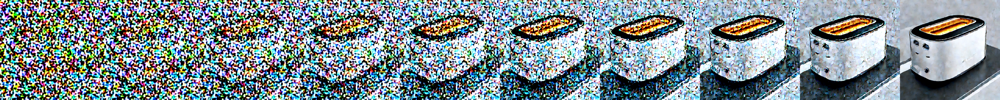

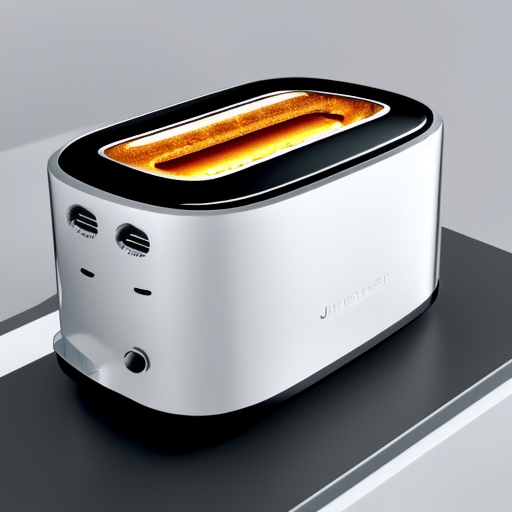

In [41]:
prompt = ['A toaster in the style of Jony Ive; modern; realistic; different; apple; form over function']
diffuser = Diffuser(prompts=prompt, neg_prompt=['wood'], seed=42)
Image.fromarray(diffuser.diffuse(interval=7)[0])

:::{.content-hidden}
### Image to Image
:::

:::{.content-hidden}
Instead of starting from noise, let's add an option to our diffuser that makes it begin from an image we provide it.

To do so, we'll need to change our diffuser class in the following two ways:
* Code needs to be added that _compresses_ the image.
* Code needs to be tweaked so the diffuser begins from this compressed image, rather than random noise.

We'll use following image as our starting point.
:::

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  221k  100  221k    0     0  2087k      0 --:--:-- --:--:-- --:--:-- 2087k


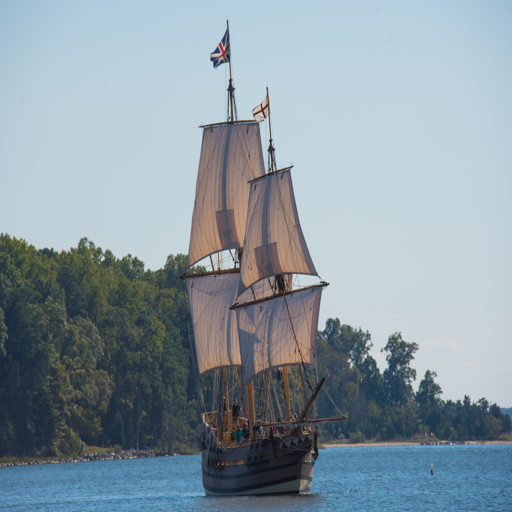

In [42]:
#| echo: false
#| output: false
!curl --output ship.jpg 'https://images.unsplash.com/photo-1508094902356-db488e227d75?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=1740&q=80'
img = Image.open('ship.jpg').resize((512, 512)); img

:::{.content-hidden}
#### Review
:::

:::{.content-hidden}
Before implementing the above, let's quickly review how the latents were set to random noise and how they were decompressed.
:::

:::{.content-hidden}
##### Setting the Latents
:::

In [43]:
#| echo: false
#| output: false
bs, unet.config.in_channels, h, w

(1, 4, 512, 512)

In [44]:
#| echo: false
#| output: false
torch.manual_seed(100)
lat = torch.randn((bs, unet.config.in_channels, h//8, w//8)) # <1>
lat.shape

torch.Size([1, 4, 64, 64])

:::{.content-hidden}
1. Here, we create a rank 4 tensor comprised of random values.
:::

In [45]:
#| echo: false
#| output: false
sched.set_timesteps(n_inf_steps)
lat = lat.to('cuda').half() * sched.init_noise_sigma # <2>

:::{.content-hidden}
2. Here we scale the random noise so it can work with the scheduler.
:::

:::{.content-hidden}
##### Decompressing the Latents
:::

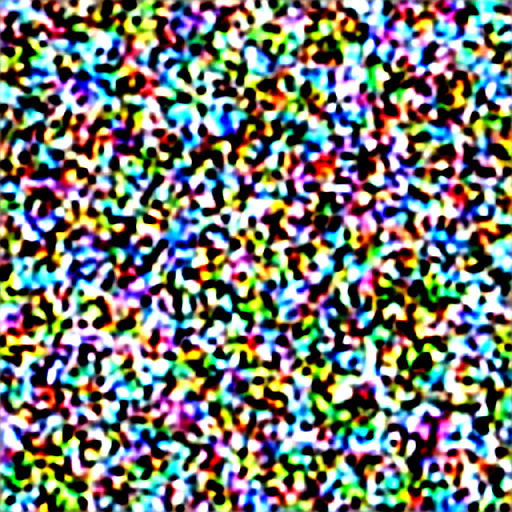

In [46]:
#| echo: false
#| output: false
with torch.no_grad(): img = vae.decode(1/0.18215*lat).sample # <1>
img = (img / 2 + 0.5).clamp(0, 1) # <2>
img = img[0].detach().cpu().permute(1, 2, 0).numpy() # <2>
img = (img*255).round().astype('uint8') # <2>
Image.fromarray(img)

:::{.content-hidden}
1. Here is where the decompression occurs.
2. And these lines simply normalize the resulting tensor so it can be displayed.
:::

:::{.content-hidden}
#### Implementation
:::

:::{.content-hidden}
We first need to convert the loaded image into a PyTorch tensor.
:::

In [47]:
#| echo: false
#| output: false
import torchvision.transforms as T

trans = T.Compose([T.ToTensor()])
img = trans(img); img.shape

torch.Size([3, 512, 512])

:::{.content-hidden}
Our rank 3 tensor has 3 channels and is 512 by 512 pixels. 

We need to add an additional dimension for the batch size.
:::

In [48]:
#| echo: false
#| output: false
img.unsqueeze_(0).shape

torch.Size([1, 3, 512, 512])

:::{.content-hidden}
Now we can compress our latent to 64 by 64 pixels with 4 channels.
:::

In [49]:
#| echo: false
#| output: false
with torch.no_grad(): lat = vae.encode(img.to('cuda').half()*2-1)
lat = 0.18215 * lat.latent_dist.sample(); lat.shape

torch.Size([1, 4, 64, 64])

:::{.content-hidden}
And that's it! Let's add it to our diffuser class.
:::

In [50]:
#| echo: false
#| output: false
class Diffuser:
  def __init__(self, prompts, neg_prompt=[''], image=None, guidance=7.5, seed=100, steps=70, width=512, height=512):
    self.prompts = prompts
    self.bs = len(prompts)
    self.neg_prompt = neg_prompt
    self.img = image
    self.g = guidance
    self.seed = seed
    self.steps = steps
    self.w = width
    self.h = height
  
  def diffuse(self, interval=0):
    embs = self.set_embs()
    lats = self.set_lats()
    if interval > 0:
      row = []
      for i, ts in enumerate(tqdm(sched.timesteps)):
        lats = self.denoise(lats, embs, ts)
        if (i % interval) == 0: row.append(self.decompress_lats(lats)[0])
      row = np.concatenate(row, axis=1)
      display(Image.fromarray(row))
    else: 
      for i, ts in enumerate(tqdm(sched.timesteps)): lats = self.denoise(lats, embs, ts)
    return self.decompress_lats(lats)
  
  def set_embs(self):
    txt_inp = self.tok_seq(self.prompts)
    neg_inp = self.tok_seq(self.neg_prompt * len(self.prompts))

    txt_embs = self.make_embs(txt_inp['input_ids'])
    neg_embs = self.make_embs(neg_inp['input_ids'])
    return torch.cat([neg_embs, txt_embs])
  
  def tok_seq(self, prompts, max_len=None):
    if max_len is None: max_len = tokz.model_max_length
    return tokz(prompts, padding='max_length', max_length=max_len, truncation=True, return_tensors='pt')    
  
  def make_embs(self, input_ids):
    return txt_enc(input_ids.to('cuda'))[0].half()

  def set_lats(self):
    if self.img is None:
      torch.manual_seed(self.seed)
      lats = torch.randn((self.bs, unet.config.in_channels, self.h//8, self.w//8))
      sched.set_timesteps(self.steps)
      return lats.to('cuda').half() * sched.init_noise_sigma
    else:
      trans = T.Compose([T.ToTensor()])
      img = trans(self.img).unsqueeze(0)
      with torch.no_grad(): lats = vae.encode(img.to('cuda').half()*2-1)
      lats = 0.18215 * lats.latent_dist.sample()
      start_step = 10
      start_sigma = sched.sigmas[start_step]
      noise = torch.randn_like(lats)
      print(tensor([sched.timesteps[start_step]]).shape)
      lats = sched.add_noise(lats, noise, timesteps=tensor([sched.timesteps[start_step]]))
      return lats.to('cuda').float()

  def denoise(self, latents, embeddings, timestep):
    inp = sched.scale_model_input(torch.cat([latents]*2), timestep)
    with torch.no_grad(): pred_neg, pred_txt = unet(inp, timestep, encoder_hidden_states=embeddings).sample.chunk(2)
    pred = pred_neg + self.g * (pred_txt - pred_neg)
    return sched.step(pred, timestep, latents).prev_sample

  def decompress_lats(self, latents):
    with torch.no_grad(): imgs = vae.decode(1/0.18215*latents).sample
    imgs = (imgs / 2 + 0.5).clamp(0, 1)
    imgs = [img.detach().cpu().permute(1, 2, 0).numpy() for img in imgs]
    return [(img*255).round().astype('uint8') for img in imgs]

  def update_params(self, **kwargs):
    allowed_params = ['prompts', 'neg_prompt', 'guidance', 'seed', 'steps', 'width', 'height']
    for key, value in kwargs.items():
      if key not in allowed_params:
        raise ValueError(f"Invalid parameter name: {key}")
      if key == 'prompts':
        self.prompts = value
        self.bs = len(value)
      else:
        setattr(self, key, value)

:::{.content-hidden}
Let's test it out.
:::

In [51]:
#| echo: false
#| output: false
!curl --output ship.jpg 'https://images.unsplash.com/photo-1508094902356-db488e227d75?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=1740&q=80'
img = Image.open('ship.jpg').resize((512, 512)); img
prompts = [
    'Oil painting of a ship sailing in a lake by Van Gogh'
]
sched = LMSDiscreteScheduler(
    beta_start = 0.00085,
    beta_end = 0.012,
    beta_schedule = 'scaled_linear',
    num_train_timesteps = 1000
)
sched.set_timesteps(n_inf_steps)
diffuser = Diffuser(prompts=prompts, image=img, seed=42)
Image.fromarray(diffuser.diffuse()[0])

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  221k  100  221k    0     0  2698k      0 --:--:-- --:--:-- --:--:-- 2698k
torch.Size([1])


RuntimeError: ignored

::::{.content-hidden}
:::{.callout-important appearance='simple'}
I have not included the image to image portion above because I can't seem to figure out why I'm getting the error above.
:::
::::

## Conclusion

And there you have it! All that's happening is:

* A compressed, noisy image is generated.
* The noise in the image is predicted.
* The predicted noise is subtracted.
* This is repeated until desired.
* The final image is decompressed.

If you have any comments, questions, suggestions, feedback, criticisms, or corrections, please do post them down in the comment section below!